In [0]:
import os

import cv2

import numpy as np

import matplotlib.pyplot as plt

from keras.utils import np_utils

import pandas as pd


from sklearn.utils import shuffle

from sklearn.model_selection import train_test_split

# Import tensorflow as the backend for Keras

from keras import backend as K

K.set_image_dim_ordering('tf')

from keras.utils import np_utils

from keras.models import Sequential

from keras.layers.core import Dense, Dropout, Activation, Flatten

from keras.layers.convolutional import Convolution2D, MaxPooling2D

from keras.optimizers import SGD,RMSprop,adam

from keras.callbacks import TensorBoard

# Import required libraries for cnfusion matrix

from sklearn.metrics import classification_report,confusion_matrix

import itertools
import os
from tqdm import tqdm_notebook, tnrange
from tqdm import tqdm
import sys
import random
import math
import numpy as np
import cv2
import matplotlib.pyplot as plt
import json
from imgaug import augmenters as iaa


import glob 

In [0]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from sklearn.model_selection import train_test_split

from skimage.transform import resize

from keras.preprocessing.image import load_img

In [4]:
from google.colab import drive

drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [6]:
!git clone https://www.github.com/matterport/Mask_RCNN.git

fatal: destination path 'Mask_RCNN' already exists and is not an empty directory.


In [0]:
sys.path.append('/content/Mask_RCNN/')

from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

In [0]:
sys.path.remove(sys.path[-1])

In [0]:
sys.path

In [0]:
!wget --quiet https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5


In [0]:
COCO_WEIGHTS_PATH = "/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/mask_rcnn_coco.h5"

In [0]:
add=os.listdir("/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/original/");
train_dicom_dir='/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/original/'
path1='/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/mask/'

In [0]:
debug = False

class DetectorConfig(Config):    
    # Give the configuration a recognizable name  
    NAME = 'airbus'
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 9
    
    BACKBONE = 'resnet50'
    
    NUM_CLASSES = 2  # background and ship classes
    
    IMAGE_MIN_DIM = 384
    IMAGE_MAX_DIM = 384
    RPN_ANCHOR_SCALES = (8, 16, 32, 64)
    TRAIN_ROIS_PER_IMAGE = 64
    MAX_GT_INSTANCES = 14
    DETECTION_MAX_INSTANCES = 10
    DETECTION_MIN_CONFIDENCE = 0.95
    DETECTION_NMS_THRESHOLD = 0.0

    STEPS_PER_EPOCH = 15 if debug else 150
    VALIDATION_STEPS = 10 if debug else 125
    
    ## balance out losses
    LOSS_WEIGHTS = {
        "rpn_class_loss": 30.0,
        "rpn_bbox_loss": 0.8,
        "mrcnn_class_loss": 6.0,
        "mrcnn_bbox_loss": 1.0,
        "mrcnn_mask_loss": 1.2
    }
config = DetectorConfig()

In [40]:
add

['fault09.jpg',
 'fault146.jpg',
 'fault147.jpg',
 'fault148.jpg',
 'fault149.jpg',
 'fault150.jpg',
 'fault151.jpg',
 'fa229.jpg',
 'fa230.jpg',
 'fa232.jpg',
 'fa231.jpg',
 'fa233.jpg',
 'fa234.jpg',
 'fa235.jpg',
 'fa236.jpg',
 'fa237.jpg',
 'fa238.jpg',
 'fa239.jpg',
 'fault145.jpg',
 'fault144.jpg',
 'fault143.jpg',
 'fault142.jpg',
 'fault141.jpg',
 'fault140.jpg',
 'fault139.jpg',
 'fault138.jpg',
 'fault137.jpg',
 'fault136.jpg',
 'fault135.jpg',
 'fault134.jpg',
 'fault133.jpg',
 'fault132.jpg',
 'fault131.jpg',
 'fault130.jpg',
 'fault129.jpg',
 'fault128.jpg',
 'fault127.jpg',
 'fault126.jpg',
 'fault125.jpg',
 'fault124.jpg',
 'fault123.jpg',
 'fault122.jpg',
 'fault121.jpg',
 'fault120.jpg',
 'fault119.jpg',
 'fault118.jpg',
 'fault117.jpg',
 'fault116.jpg',
 'fault115.jpg',
 'fault114.jpg',
 'fault113.jpg',
 'fault112.jpg',
 'fault111.jpg',
 'fault110.jpg',
 'fault109.jpg',
 'fault108.jpg',
 'fault105.jpg',
 'fault104.jpg',
 'fault103.jpg',
 'fault102.jpg',
 'fault101.jpg

In [0]:
for i in range(0,len(add)):
  add[i]=add[i].replace('.JPG','')
  add[i]=add[i].replace('.jpg','')
  


In [0]:
image_fps_train, image_fps_val = train_test_split(train_names, test_size=0.1, random_state=42)

In [0]:
if debug:
    image_fps_train = image_fps_train[:100]
    image_fps_val = image_fps_val[:100]
    test_names = test_names[:100]
    

In [0]:
dataset_train = DetectorDataset(image_fps_train, image_annotations, ORIG_SIZE, ORIG_SIZE)

In [0]:
im_height=im_width=256
im_chan=3
X_train = np.zeros((len(add), im_height, im_width, im_chan), dtype=np.float)
Y_train = np.zeros((len(add), im_height, im_width, 1), dtype=np.bool)

In [0]:
for n, id_ in tqdm(enumerate(add), total=len(add)):
    path = add_
    try:
      img = load_img(path  + id_+'.JPG')
    except Exception:
      img = load_img(path  + id_+'.jpg')
    
    x = img_to_array(img)[:,:,:im_chan]
    x = resize(x, (256, 256,3), mode='constant', preserve_range=True)
    X_train[n] = x
    try:
      mask = img_to_array(load_img(path1  + id_+'.JPG'))[:,:,1]
    except Exception:
      mask = img_to_array(load_img(path1  + id_+'.jpg'))[:,:,1]
    Y_train[n] = resize(mask, (256, 256, 1), mode='constant', preserve_range=True)

print('Done!')
    

In [0]:
ROOT_DIR='/content/gdrive/My Drive/temp'
model = modellib.MaskRCNN(mode='training', config=config, model_dir=ROOT_DIR)

# Exclude the last layers because they require a matching
# number of classes
model.load_weights(COCO_WEIGHTS_PATH, by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc",
    "mrcnn_bbox", "mrcnn_mask"])
LEARNING_RATE = 0.003
model.train(X_train, Y_train,
            #validation_split=0.2,
            learning_rate=LEARNING_RATE*2,
            epochs=2,
            layers='heads'
          )
    

In [0]:
add[10]

'fault85.jpg'

In [0]:
try:
  a=cv2.imdecode(np.fromfile('/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/mask/'+add[10], dtype=np.uint8),-1)
except Exception:
  a=cv2.imdecode(np.fromfile('/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/mask/'+add[10]+'.JPG', dtype=np.uint8),-1)

In [0]:
from skimage.morphology import binary_opening, disk, label
def multi_rle_encode(img, **kwargs):
    '''
    Encode connected regions as separated masks
    '''
    labels = label(img)
    if img.ndim > 2:
        return [rle_encode(np.sum(labels==k, axis=2), **kwargs) for k in np.unique(labels[labels>0])]
    else:
        return [rle_encode(labels==k, **kwargs) for k in np.unique(labels[labels>0])]

def rle_encode(img, min_max_threshold=1e-3, max_mean_threshold=None):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    if np.max(img) < min_max_threshold:
        return '' ## no need to encode if it's all zeros
    if max_mean_threshold and np.mean(img) > max_mean_threshold:
        return '' ## ignore overfilled mask
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=(250, 250)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    img = np.zeros((shape[0],shape[1]), dtype=np.uint8)
    for i,j in zip(starts, lengths):
      img[i,j] = 1
    
    
    return img.reshape(shape)  # Needed to align to RLE direction

def masks_as_image(in_mask_list):
    # Take the individual ship masks and create a single mask array for all ships
    all_masks = np.zeros((250, 250), dtype = np.uint8)
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks |= rle_decode(mask)
    return all_masks

def masks_as_color(in_mask_list):
    # Take the individual ship masks and create a color mask array for each ships
    all_masks = np.zeros((768, 768), dtype = np.float)
    scale = lambda x: (len(in_mask_list)+x+1) / (len(in_mask_list)*2) ## scale the heatmap image to shift 
    for i,mask in enumerate(in_mask_list):
        if isinstance(mask, str):
            all_masks[:,:] += scale(i) * rle_decode(mask)
    return all_masks

In [0]:
b=rle_decode(a, shape=(250, 250))

In [0]:
a

In [0]:
starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]

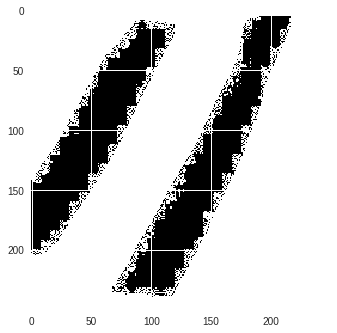

In [50]:
shape=[250, 250]
plt.imshow(b)

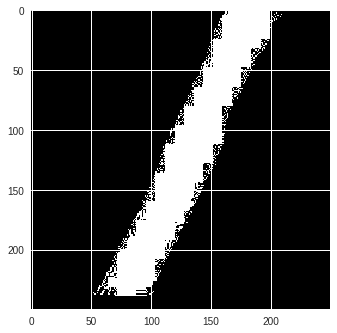

In [0]:
plt.imshow(img)

In [0]:
starts

array([ -1,  -1,  -1, ..., 237, 237, 237])

In [0]:
np.zeros((2,9))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [0]:
starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to alig

In [43]:
a

'5 191 5 192 5 193 5 194 5 195 5 196 5 197 5 198 5 199 5 200 5 201 5 202 5 203 5 204 5 205 5 206 5 207 5 208 5 209 5 210 5 211 5 212 5 213 5 214 5 215 5 216 6 189 6 192 6 193 6 194 6 195 6 196 6 197 6 198 6 199 6 200 6 201 6 202 6 203 6 204 6 205 6 206 6 207 6 208 6 209 6 210 6 211 6 212 6 213 6 214 6 215 6 216 7 183 7 185 7 187 7 192 7 193 7 194 7 195 7 196 7 197 7 198 7 199 7 200 7 201 7 202 7 203 7 204 7 205 7 206 7 207 7 208 7 209 7 210 7 211 7 212 7 213 7 214 7 215 8 91 8 92 8 93 8 94 8 181 8 183 8 185 8 186 8 187 8 189 8 190 8 191 8 192 8 193 8 194 8 195 8 196 8 197 8 198 8 199 8 200 8 201 8 202 8 203 8 204 8 205 8 206 8 207 8 208 8 209 8 210 8 211 8 212 8 213 8 214 8 215 9 87 9 92 9 93 9 99 9 105 9 185 9 186 9 187 9 188 9 189 9 190 9 191 9 192 9 193 9 194 9 195 9 196 9 197 9 198 9 199 9 200 9 201 9 202 9 203 9 204 9 205 9 206 9 207 9 208 9 209 9 210 9 211 9 212 9 213 9 214 9 215 10 90 10 91 10 92 10 93 10 94 10 96 10 100 10 104 10 112 10 182 10 185 10 186 10 187 10 188 10 189 10

In [44]:
pixels = a.T.flatten()
pixels = np.concatenate([[0], pixels, [0]])
runs = np.where(pixels[1:] != pixels[:-1])[0] + 1

AttributeError: ignored

In [0]:
a=a/255
for i in range(0,150):



In [0]:
'/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/mask/'+add[0]

'/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/mask/fault19.jpg'

In [0]:
a=cv2.imdecode(np.fromfile('/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/mask/'+add[1], dtype=np.uint8),-1)

In [0]:
add[1]

'fault17.jpg'

In [0]:
a=a/255

In [0]:
nnn.shape

(2, 9079)

In [0]:
nnn=np.array(np.where(a[:,:,0]==1))

In [0]:
nnn

array([[ 61,  62,  62, ..., 244, 244, 244],
       [139, 137, 140, ...,  30,  69,  70]])

In [0]:
temp=[]
for j in range(0,9079):
  for i in range(0,2):
    temp.append(nnn[i,j])
    


In [0]:

a=123
' '.join(str(x) for x in temp)

'61 139 62 137 62 140 62 142 63 136 63 145 64 139 64 140 64 141 64 142 64 143 64 146 64 147 65 138 65 139 65 140 65 141 65 142 65 143 65 144 65 145 65 146 65 147 65 148 65 152 65 153 66 136 66 137 66 138 66 139 66 140 66 141 66 142 66 143 66 144 66 145 66 146 66 147 66 148 66 149 66 152 66 156 67 136 67 137 67 138 67 139 67 140 67 141 67 142 67 143 67 144 67 145 67 146 67 147 67 148 67 149 67 150 67 151 67 153 67 157 67 158 67 162 68 136 68 137 68 138 68 139 68 140 68 141 68 142 68 143 68 144 68 145 68 146 68 147 68 148 68 149 68 150 68 151 68 152 68 154 68 155 68 156 68 159 68 170 68 190 69 135 69 136 69 137 69 138 69 139 69 140 69 141 69 142 69 143 69 144 69 145 69 146 69 147 69 148 69 149 69 150 69 151 69 153 69 161 69 171 69 173 69 175 69 177 69 178 69 180 70 134 70 136 70 137 70 138 70 139 70 140 70 141 70 142 70 143 70 144 70 145 70 146 70 147 70 148 70 149 70 150 70 151 70 155 70 158 70 160 70 162 70 163 70 164 70 166 70 168 70 169 70 170 70 172 70 174 70 178 70 181 70 186 70 18

In [0]:
def rle_encode1(img):
  img=img/255
  nnn=np.array(np.where(img[:,:,0]==1))
  temp=[]
  for j in range(0,nnn.shape[1]):
    for i in range(0,2):
      temp.append(nnn[i,j])
  s1=' '.join(str(x) for x in temp)
  return s1
  
  

In [0]:
a=a/255

In [0]:
rle_encode1(a)

''

In [0]:
nnn=np.array(np.where(a[:,:,0]==1))

In [0]:
temp=[]
for j in range(0,9079):
  for i in range(0,2):
    temp.append(nnn[i,j])

IndexError: ignored

In [0]:
anns=pd.DataFrame(add)

In [0]:
anns.columns=['ImageId']


In [0]:
anns['EncodedPixels']=None

In [79]:
anns.shape

(194, 2)

In [80]:
for i in tqdm(range(0,anns.shape[0])):
  a=cv2.imdecode(np.fromfile('/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/mask/'+add[i], dtype=np.uint8),-1)
  anns['EncodedPixels'][i]=rle_encode1(a)
  


100%|██████████| 194/194 [00:05<00:00, 38.05it/s]

In [0]:
for i in tqdm(range(0,anns.shape[0])):
  try:
    a=cv2.imdecode(np.fromfile('/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/mask/'+add[i]+'.jpg', dtype=np.uint8),-1)
  except Exception:
    a=cv2.imdecode(np.fromfile('/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/mask/'+add[i]+'.JPG', dtype=np.uint8),-1)
  anns['EncodedPixels'][i]=  rle_encode(a/255)

In [0]:
anns

(250, 250)

In [0]:
anns

In [0]:
class DetectorDataset(utils.Dataset):
    """Dataset class for training our dataset.
    """

    def __init__(self, image_fps, image_annotations, orig_height, orig_width):
        super().__init__(self)
        
        # Add classes
        self.add_class('fault', 1, 'fault')
        
        # add images 
        for i, fp in enumerate(image_fps):
            annotations = image_annotations.query('ImageId=="' + fp + '"')['EncodedPixels']
            self.add_image('fault', image_id=i, path=os.path.join(train_dicom_dir, fp), 
                           annotations=annotations, orig_height=orig_height, orig_width=orig_width)
            
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

    def load_image(self, image_id):
        info = self.image_info[image_id]
        fp = info['path']
        image = imread(fp)
        # If grayscale. Convert to RGB for consistency.
        if len(image.shape) != 3 or image.shape[2] != 3:
            image = np.stack((image,) * 3, -1)
        return image

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        annotations = info['annotations']
#         print(image_id, annotations)
        count = len(annotations)
        if count == 0:
            mask = np.zeros((info['orig_height'], info['orig_width'], 1), dtype=np.uint8)
            class_ids = np.zeros((1,), dtype=np.int32)
        else:
            mask = np.zeros((info['orig_height'], info['orig_width'], count), dtype=np.uint8)
            class_ids = np.zeros((count,), dtype=np.int32)
            for i, a in enumerate(annotations):
                mask[:, :, i] = rle_decode(a)
                class_ids[i] = 1
        return mask.astype(np.bool), class_ids.astype(np.int32)

In [42]:
a=anns.iloc[1,1]
rle_decode(a)

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [0]:
anns.iloc[1,0]

'fault17.jpg'

In [0]:
train_names =add
image_fps, image_annotations = train_names, anns
image_fps_train, image_fps_val = train_test_split(train_names, test_size=0.2, random_state=42)

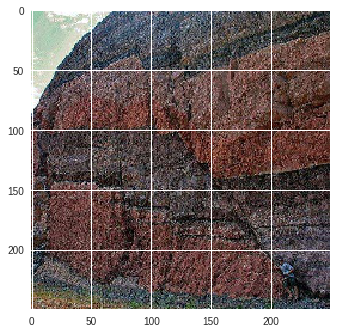

In [59]:
ds = imread(os.path.join(train_dicom_dir, image_fps[0])) # read  image from filepath 
_ = plt.imshow(ds)

In [60]:
ORIG_SIZE = ds.shape[0]
ORIG_SIZE

250

In [0]:
dataset_train = DetectorDataset(image_fps_train, image_annotations, ORIG_SIZE, ORIG_SIZE)
dataset_train.prepare()

dataset_val = DetectorDataset(image_fps_val, image_annotations, ORIG_SIZE, ORIG_SIZE)
dataset_val.prepare()

(250, 250, 3)
/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/seg_要用的/correct/original/fault47.jpg
[1]


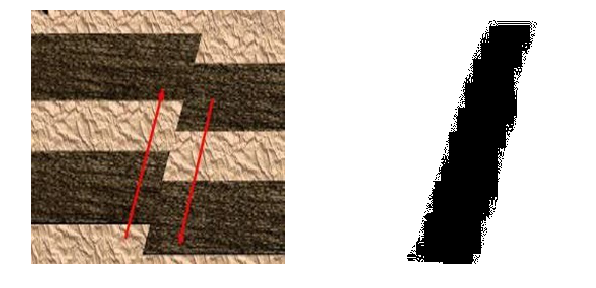

In [82]:
class_ids = [0]
while class_ids[0] == 0:  ## look for a mask
    image_id = random.choice(dataset_val.image_ids)
    image_fp = dataset_val.image_reference(image_id)
    image = dataset_val.load_image(image_id)
    mask, class_ids = dataset_val.load_mask(image_id)

print(image.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
masked = np.ones(image.shape[:2])
for i in range(mask.shape[2]):
    masked -= mask[:, :, i] ## * image[:, :, 0]
plt.imshow(masked, cmap='gray')
plt.axis('off')

print(image_fp)
print(class_ids)

In [0]:
mask

In [0]:
dataset_val.image_ids

[]

In [0]:
config = DetectorConfig()

model = modellib.MaskRCNN(mode='training', config=config, model_dir='/content/gdrive/My Drive/temp')

# Exclude the last layers because they require a matching
# number of classes
model.load_weights(COCO_WEIGHTS_PATH, by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc",
    "mrcnn_bbox", "mrcnn_mask"])

In [92]:
LEARNING_RATE=0.001
model.train(dataset_train, dataset_val,
            learning_rate=LEARNING_RATE*2,
            epochs=15,
            layers='heads',
            augmentation=None) 


Starting at epoch 0. LR=0.002

Checkpoint Path: /content/gdrive/My Drive/temp/airbus20190115T1153/mask_rcnn_airbus_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_m

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:112: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 1/15
150/150 [==============================] - 526s 4s/step - loss: 4.0912 - rpn_class_loss: 0.2073 - rpn_bbox_loss: 2.1881 - mrcnn_class_loss: 0.6030 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.5399 - val_loss: 3.7760 - val_rpn_class_loss: 0.1469 - val_rpn_bbox_loss: 1.5516 - val_mrcnn_class_loss: 0.9187 - val_mrcnn_bbox_loss: 0.6482 - val_mrcnn_mask_loss: 0.5107
Epoch 2/15
150/150 [==============================] - 387s 3s/step - loss: 3.1151 - rpn_class_loss: 0.1230 - rpn_bbox_loss: 1.3371 - mrcnn_class_loss: 0.8487 - mrcnn_bbox_loss: 0.3584 - mrcnn_mask_loss: 0.4478 - val_loss: 3.4701 - val_rpn_class_loss: 0.1444 - val_rpn_bbox_loss: 1.7391 - val_mrcnn_class_loss: 0.6746 - val_mrcnn_bbox_loss: 0.4595 - val_mrcnn_mask_loss: 0.4524
Epoch 3/15
150/150 [==============================] - 385s 3s/step - loss: 2.5948 - rpn_class_loss: 0.1035 - rpn_bbox_loss: 1.0150 - mrcnn_class_loss: 0.7825 - mrcnn_bbox_loss: 0.2861 - mrcnn_mask_loss: 0.4077 - val_loss: 3.6228 - val_rpn_class_l

In [0]:
augmentation = iaa.Sequential()
LEARNING_RATE=0.001
model.train(dataset_train, dataset_val,
            learning_rate=LEARNING_RATE*2,
            epochs=4,
            layers='all',
            augmentation=augmentation
           )

#new_history = model.keras_model.history.history
#for k in new_history: history[k] = history[k] + new_history[k]

In [0]:
#best_epoch= np.argmin(history["val_loss"])
best_epoch= 3

In [0]:
model_path

'/content/gdrive/My Drive/temp/airbus20190114T0356/mask_rcnn_airbus_0002.h5'

In [0]:

dir_names = next(os.walk(model.model_dir))[1]
key = config.NAME.lower()
dir_names = filter(lambda f: f.startswith(key), dir_names)
dir_names = sorted(dir_names)

if not dir_names:
    import errno
    raise FileNotFoundError(
        errno.ENOENT,
        "Could not find model directory under {}".format(self.model_dir))

fps = []
# Pick last directory
for d in dir_names: 
    dir_name = os.path.join(model.model_dir, d)
    # Find the last checkpoint
    checkpoints = next(os.walk(dir_name))[2]
    checkpoints = filter(lambda f: f.startswith("mask_rcnn"), checkpoints)
    checkpoints = sorted(checkpoints)
    if not checkpoints:
        print('No weight files in {}'.format(dir_name))
    else:
        checkpoint = os.path.join(dir_name, checkpoints[best_epoch])
        fps.append(checkpoint)

model_path = sorted(fps)[-1]
print('Found model {}'.format(model_path))

In [93]:
class InferenceConfig(DetectorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir='/content/gdrive/My Drive/temp')

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /content/gdrive/My Drive/temp/airbus20190115T0835/mask_rcnn_airbus_0010.h5
Re-starting from epoch 10


In [94]:
model_path='/content/gdrive/My Drive/temp/airbus20190115T1153/mask_rcnn_airbus_0015.h5'
model.load_weights(model_path, by_name=True)

Re-starting from epoch 15


In [0]:
def get_colors_for_class_ids(class_ids):
    colors = []
    for class_id in class_ids:
        if class_id == 0:
            colors.append((.941, .204, .204))
    return colors

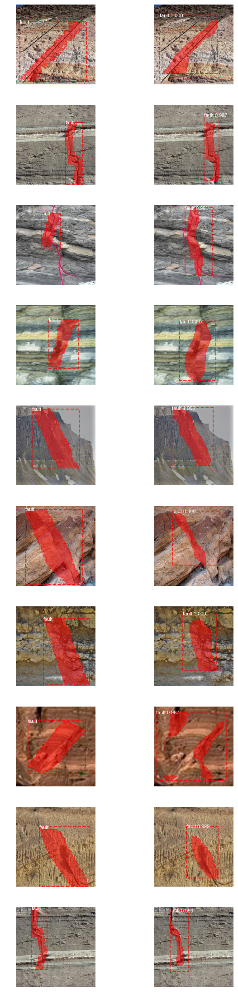

In [95]:
dataset = dataset_val
fig = plt.figure(figsize=(10, 40))

for i in range(10):

    image_id = random.choice(dataset.image_ids)
    
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config, 
                               image_id, use_mini_mask=False)
    
#     print(original_image.shape)
    plt.subplot(10, 2, 2*i + 1)
    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                dataset.class_names,
                                colors=get_colors_for_class_ids(gt_class_id), ax=fig.axes[-1])
    
    plt.subplot(10, 2, 2*i + 2)
    results = model.detect([original_image]) #, verbose=1)
    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], 
                                colors=get_colors_for_class_ids(r['class_ids']), ax=fig.axes[-1],
                               )

In [0]:
results[0]

{'class_ids': array([1], dtype=int32), 'masks': array([[[False],
         [False],
         [False],
         ...,
         [False],
         [False],
         [False]],
 
        [[False],
         [False],
         [False],
         ...,
         [False],
         [False],
         [False]],
 
        [[False],
         [False],
         [False],
         ...,
         [False],
         [False],
         [False]],
 
        ...,
 
        [[False],
         [False],
         [False],
         ...,
         [False],
         [False],
         [False]],
 
        [[False],
         [False],
         [False],
         ...,
         [False],
         [False],
         [False]],
 
        [[False],
         [False],
         [False],
         ...,
         [False],
         [False],
         [False]]]), 'rois': array([[  0,   1, 384, 375]], dtype=int32), 'scores': array([0.99964345], dtype=float32)}

In [0]:
cal=os.listdir('/content/gdrive/My Drive/Where Am I/train')
cal

In [0]:
dict={0:cal[0],1:cal[1],2:cal[2],3:cal[3],4:cal[4],5:cal[5],6:cal[6],7:cal[7],
      8:cal[8],9:cal[9],10:cal[10],11:cal[11],12:cal[12],13:cal[13],14:cal[14]}
jtemp1=np.zeros(10000)
jtemp1=pd.DataFrame(jtemp1)
jtemp1.columns=(["address"])
data=jtemp1
data['type']=None

In [0]:
k=0
for i in range(0,len(dict)):
  add1=os.listdir('/content/gdrive/My Drive/Where Am I/train/'+dict[i])
  for j in range(0,len(add1)):
    if add1[j][-3:]=='jpg':
      data.iloc[k,0]='/content/gdrive/My Drive/Where Am I/train/'+dict[i]+'/'+add1[j]
      data.iloc[k,1]=i
      k=k+1

In [0]:
k

2985

In [0]:
data_new=data.iloc[0:2985,:]

In [0]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from sklearn.model_selection import train_test_split

from skimage.transform import resize

from keras.preprocessing.image import load_img
from sklearn.preprocessing import LabelEncoder
from keras.utils.np_utils import to_categorical
cat_enc = LabelEncoder()
cat_enc.fit(data_new['type'])
data_new['type_vec'] = data_new['type'].map(lambda x: to_categorical(x, len(cat_enc.classes_)))
  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


In [0]:
import pandas as pd
from glob import glob
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from keras.utils import np_utils
from keras.preprocessing import image

import keras

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D
from itertools import chain
import numpy as np # linear algebra
from skimage.io import imread
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input


In [0]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.imagenet_utils import preprocess_input
from PIL import Image
ppi = lambda x: Image.fromarray(preprocess_input(np.array(x).astype(np.float32)))
IMG_SIZE = (512, 512) # slightly smaller than vgg16 normally expects
core_idg = ImageDataGenerator(samplewise_center=False, 
                              samplewise_std_normalization=False, 
                              horizontal_flip = True, 
                              vertical_flip = False, 
                              height_shift_range = 0.15, 
                              width_shift_range = 0.15, 
                              rotation_range = 5, 
                              shear_range = 0.01,
                              fill_mode = 'nearest',
                              zoom_range=0.2)
def flow_from_dataframe(img_data_gen, in_df, path_col, y_col, **dflow_args):
    base_dir = os.path.dirname(in_df[path_col].values[0])
    print('## Ignore next message from keras, values are replaced anyways')
    df_gen = img_data_gen.flow_from_directory(base_dir, 
                                     class_mode = 'sparse',
                                    **dflow_args)
    df_gen.filenames = in_df[path_col].values
    df_gen.classes = np.stack(in_df[y_col].values)
    df_gen.samples = in_df.shape[0]
    df_gen.n = in_df.shape[0]
    df_gen._set_index_array()
    df_gen.directory = '' # since we have the full path
    print('Reinserting dataframe: {} images'.format(in_df.shape[0]))
    return df_gen

In [0]:
train_df, valid_df = train_test_split(data_new, 
                                   test_size = 0.2, 
                                   random_state = 100,
                                   stratify = data_new['type'])

In [0]:
table=train_df.groupby('type').count()

In [0]:
table["type_vec"].max()

248

In [0]:
train_df = train_df.groupby(['type']).apply(lambda x: x.sample(248, replace = True))

In [0]:
train_df.shape

(3720, 3)

In [0]:
train_gen = flow_from_dataframe(core_idg, train_df, 
                             path_col = 'address',
                            y_col = 'type_vec', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = 10)
valid_gen = flow_from_dataframe(core_idg, valid_df, 
                             path_col = 'address',
                            y_col = 'type_vec', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = 16) # we can use much larger batches for evaluation
# used a fixed dataset for evaluating the algorithm
test_X, test_Y = next(flow_from_dataframe(core_idg, 
                               valid_df, 
                             path_col = 'address',
                            y_col = 'type_vec', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = 1024)) 

## Ignore next message from keras, values are replaced anyways
Found 1 images belonging to 1 classes.
Reinserting dataframe: 3720 images
## Ignore next message from keras, values are replaced anyways
Found 0 images belonging to 0 classes.
Reinserting dataframe: 597 images
## Ignore next message from keras, values are replaced anyways
Found 0 images belonging to 0 classes.
Reinserting dataframe: 597 images


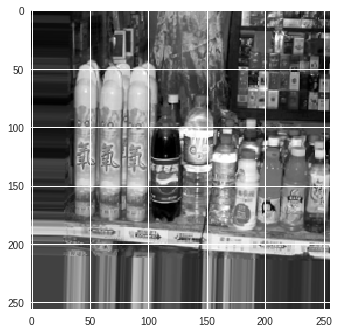

In [0]:
plt.imshow(test_X[30]/255)
plt.show()

In [0]:
t_x, t_y = next(train_gen)
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16 as PTModel, preprocess_input
base_pretrained_model = PTModel(input_shape =  t_x.shape[1:],        include_top = False, weights = 'imagenet')
base_pretrained_model.trainable = False

58892288/58889256 [==============================] - 1s 0us/step


In [0]:
from keras.applications.vgg16 import VGG16
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten, Input, Conv2D, multiply, LocallyConnected2D, Lambda
from keras.models import Model
in_lay = Input(t_x.shape[1:])
base_pretrained_model = VGG16(input_shape =  t_x.shape[1:], 
                              include_top = False, weights = 'imagenet')
base_pretrained_model.trainable = False
pt_depth = base_pretrained_model.get_output_shape_at(0)[-1]
pt_features = base_pretrained_model(in_lay)
from keras.layers import BatchNormalization
bn_features = BatchNormalization()(pt_features)

# here we do an attention mechanism to turn pixels in the GAP on an off

attn_layer = Conv2D(512, kernel_size = (1,1), padding = 'same', activation = 'relu')(bn_features)
attn_layer = Conv2D(128, kernel_size = (1,1), padding = 'same', activation = 'relu')(attn_layer)
attn_layer = Conv2D(64, kernel_size = (1,1), padding = 'same', activation = 'relu')(attn_layer)
attn_layer = Conv2D(16, kernel_size = (1,1), padding = 'same', activation = 'relu')(attn_layer)
attn_layer = Conv2D(1, 
                    kernel_size = (1,1), 
                    padding = 'valid', 
                    activation = 'sigmoid')(attn_layer)
# fan it out to all of the channels
up_c2_w = np.ones((1, 1, 1, pt_depth))
up_c2 = Conv2D(pt_depth, kernel_size = (1,1), padding = 'same', 
               activation = 'relu', use_bias = False, weights = [up_c2_w])#改這
up_c2.trainable = False
attn_layer = up_c2(attn_layer)

mask_features = multiply([attn_layer, bn_features])
gap_features = GlobalAveragePooling2D()(mask_features)
gap_mask = GlobalAveragePooling2D()(attn_layer)
# to account for missing values from the attention model
gap = Lambda(lambda x: x[0]/x[1], name = 'RescaleGAP')([gap_features, gap_mask])
gap_dr = Dropout(0.5)(gap)
dr_steps = Dropout(0.5)(Dense(128, activation = 'relu')(gap_dr))
out_layer = Dense(len(cat_enc.classes_), activation = 'softmax')(dr_steps)
tb_model = Model(inputs = [in_lay], outputs = [out_layer])

tb_model.compile(optimizer = 'adam', loss = 'categorical_crossentropy',
                           metrics = ['categorical_accuracy'])

In [0]:
from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K

import tensorflow as tf

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from sklearn.model_selection import train_test_split

from skimage.transform import resize

from keras.preprocessing.image import load_img
from keras import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [0]:

earlystopper = EarlyStopping(patience=20)
checkpointer = ModelCheckpoint('model-tgs-salt-1.h5', save_best_only=True)

In [0]:
tb_model.fit_generator(train_gen,   validation_data = (valid_gen),    epochs = 50,  validation_steps=20, steps_per_epoch=15 ,callbacks=[earlystopper, checkpointer])

NameError: ignored

In [0]:
import pickle
filename = '/content/gdrive/My Drive/20190108finalized_model.sav'
pickle.dump(tb_model, open(filename, 'wb'))

NameError: ignored

In [0]:
from sklearn.externals import joblib
loaded_model = joblib.load("/content/gdrive/My Drive/20190108finalized_model.sav")



In [0]:
Y_pred = loaded_model.predict(test_X) 

In [0]:
pre_re=tb_model.predict(test_X)

In [0]:
y_pred = np.argmax(pre_re,axis=1)

In [0]:
y_pred = np.argmax(Y_pred,axis=1)

In [0]:
y_test1 = np.argmax(test_Y,axis=1)

In [0]:
print(confusion_matrix(y_test1, y_pred))

[[19  0  0  0  0  0  1  0  0  0  1  2  0  0  0]
 [ 0 40  0  0  0  0  0  3  3  0  0  0  0  0  0]
 [ 0  2 43  0  2  0  0  3  2  0  0  0  0  0  0]
 [ 0  0  0 27  0  1  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 27  1  0  0  0  1  0  0  1  2  0]
 [ 0  0  0  2  0 36  0  0  0  0  1  0  0  3  0]
 [ 4  0  0  2  0  0 26  0  0  0  2  3  0  1  0]
 [ 0  5  7  0  0  0  0 45  5  0  0  0  0  0  0]
 [ 0  1  1  0  0  0  0  1 52  0  0  0  0  0  0]
 [ 0  0  0  0  0  2  0  1  1 32  0  0  3  2  1]
 [ 1  0  0  0  0  0  0  0  0  0 20  1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0 23  0  0  0]
 [ 1  0  0  0  0  0  1  0  0  0  0  3 37  1  0]
 [ 0  0  0  0  1  0  0  0  0  0  0  0  0 36  1]
 [ 0  1  0  0  0  1  0  0  0  2  0  0  0  0 47]]


In [0]:
print(confusion_matrix(y_test1, y_pred))

[[19  0  0  0  0  0  3  0  1  0]
 [ 0 43  0  0  0  0  0  0  3  0]
 [ 0  4 37  0  2  0  0  4  5  0]
 [ 0  0  0 26  0  2  0  0  0  0]
 [ 0  0  0  0 31  0  0  1  0  0]
 [ 0  0  0  0  0 41  0  0  0  1]
 [ 4  0  0  0  0  0 34  0  0  0]
 [ 0  7 20  0  0  0  0 31  4  0]
 [ 0  2  1  0  0  0  0  3 49  0]
 [ 1  0  0  1  2  2  1  0  0 35]]


In [0]:
from sklearn import metrics
metrics.accuracy_score(y_test1, y_pred)


0.8542713567839196

In [0]:
from sklearn import metrics
metrics.accuracy_score(y_test1, y_pred)

0.8542713567839196

In [0]:
test_X.shape

(597, 256, 256, 3)

In [0]:
from sklearn.metrics import confusion_matrix, classification_report
print('\n',classification_report(y_test1,y_pred ))


               precision    recall  f1-score   support

           0       0.76      0.83      0.79        23
           1       0.82      0.87      0.84        46
           2       0.84      0.83      0.83        52
           3       0.87      0.96      0.92        28
           4       0.90      0.84      0.87        32
           5       0.88      0.86      0.87        42
           6       0.93      0.68      0.79        38
           7       0.85      0.73      0.78        62
           8       0.83      0.95      0.88        55
           9       0.91      0.76      0.83        42
          10       0.83      0.91      0.87        22
          11       0.72      1.00      0.84        23
          12       0.90      0.86      0.88        43
          13       0.80      0.95      0.87        38
          14       0.96      0.92      0.94        51

   micro avg       0.85      0.85      0.85       597
   macro avg       0.85      0.86      0.85       597
weighted avg       0.86 

In [0]:
for i in range(100,120):
  image = test_X[i]
  plt.axis('off')
  rsize = image.resize((np.array(image.size)/10).astype(int))
  plt.title('real %s : pred %s ' % (dict[y_test1[i]],dict[y_pred[i]]))
  plt.imshow(rsize/255)
  plt.show()#37

In [0]:
test_X.shape

(597, 256, 256, 3)

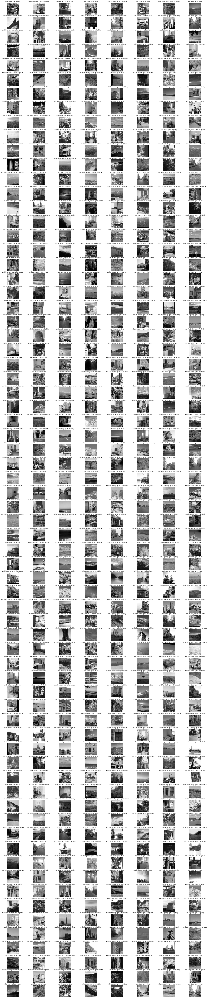

In [0]:
k=0
fig, m_axs = plt.subplots(70, 8, figsize = (30, 150))
for (c_x, c_y, c_ax) in zip(test_X, test_Y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,:]/255,  vmin = -120, vmax = 120)
    
    c_ax.set_title('real %s : pred %s ' % (dict[y_test1[k]],dict[y_pred[k]]))
    c_ax.axis('off')
    k=k+1

In [0]:
pics = []
img_height=img_width=512

for i in tqdm(address1):
  tmp_img = cv2.imread(i)
  tmp_img = cv2.cvtColor(tmp_img, cv2.COLOR_BGR2RGB)
  tmp_img = cv2.resize(tmp_img, (img_height, img_width)) # 進行大小歸一位  
  pics.append(tmp_img)
  
    

             

  
          #  tmp_img = cv2.imread(pic)


100%|██████████| 2985/2985 [00:18<00:00, 162.20it/s]


In [0]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle
import h5py
import glob
import time
from random import shuffle
from collections import Counter

from sklearn.model_selection import train_test_split

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import LearningRateScheduler, ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD, Adam

In [0]:
address1=list(data_new.iloc[:,0])

In [0]:
Y = np_utils.to_categorical(label, len(cal))

In [0]:
X_train, X_test, y_train, y_test=train_test_split(pics, Y,
                                   test_size = 0.2, 
                                   random_state = 100
                                   )

In [0]:
pics=np.array(pics)

In [0]:
label=np.array(list(data_new["type"]))

In [0]:
X_train.shape

(2388, 512, 512, 3)

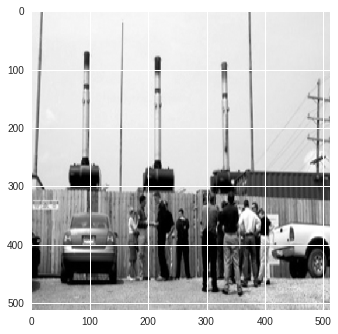

In [0]:
plt.imshow(X_train[2])

In [0]:
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(img_height, img_width,3)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))
    
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))
    
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))
    
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
    
model.add(Dense(len(cal), activation='softmax'))


In [0]:
lr = 0.01
sgd = SGD(lr=lr, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy',
             optimizer=sgd,
             metrics=['accuracy'])

In [0]:
def lr_schedule(epoch):
  return lr*(0.1**int(epoch/10))
batch_size = 8
epochs = 30

history = model.fit(X_train, y_train,
         batch_size=batch_size,
         epochs=epochs,
         validation_data=(X_test, y_test),
         shuffle=True,
         callbacks=[LearningRateScheduler(lr_schedule),
             ModelCheckpoint('model.h5', save_best_only=True)
         ])

In [0]:
model.fit_generator(train_gen,   validation_data = (valid_gen),    epochs = 40,  validation_steps=10, steps_per_epoch=10 ,callbacks=[earlystopper, checkpointer])

In [0]:
data_dir_list = os.listdir("/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/確定使用圖片(含LABEL)")
PATH="/content/gdrive/Team Drives/影像辨識專題-自己小組/圖片檔/確定使用圖片(含LABEL)"

In [0]:
jtemp1=np.zeros(539)
jtemp1=pd.DataFrame(jtemp1)
jtemp1.columns=(["address"])

In [0]:
for j in range(0,len(data_dir_list)):
    jtemp1.iloc[j,0]=os.path.join(PATH,data_dir_list[j])

In [0]:
data=jtemp1
data["type"]=None

for id4 in range(0,len(data_dir_list)):
    if data_dir_list[id4][0:2]=="an":
        data["type"][id4]=2
    elif data_dir_list[id4][0:2]=="fo":
        data["type"][id4]=0
    elif data_dir_list[id4][0:2]=="fa":
        data["type"][id4]=1

In [0]:
from sklearn.preprocessing import LabelEncoder
from keras.utils.np_utils import to_categorical
cat_enc = LabelEncoder()
cat_enc.fit(data['type'])

data['type_vec'] = data['type'].map(lambda x: to_categorical(x, len(cat_enc.classes_)))

In [0]:
train_df, valid_df = train_test_split(data, 
                                   test_size = 0.25, 
                                   random_state = 2018,
                                   stratify = data['type'])

In [0]:
train_df.groupby('type').count()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: 'type' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
  """Entry point for launching an IPython kernel.


,address,type_vec
type,,
0,154,154
1,154,154
2,154,154


In [0]:
train_df = train_df.groupby(['type']).apply(lambda x: x.sample(154, replace = True))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: 'type' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
  """Entry point for launching an IPython kernel.


In [0]:
train_gen = flow_from_dataframe(core_idg, train_df, 
                             path_col = 'address',
                            y_col = 'type_vec', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = 32)

## Ignore next message from keras, values are replaced anyways
Found 0 images belonging to 0 classes.
Reinserting dataframe: 453 images


In [0]:
test_X, test_Y = next(flow_from_dataframe(core_idg, valid_df, 
                             path_col = 'address',
                            y_col = 'type_vec', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = 32))

## Ignore next message from keras, values are replaced anyways
Found 0 images belonging to 0 classes.
Reinserting dataframe: 135 images


In [0]:
from random import shuffle
from collections import Counter

from sklearn.model_selection import train_test_split

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import LearningRateScheduler, ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD, Adam
from tensorflow.python.keras.applications import ResNet50
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense

In [0]:
resnet_weights_path = '/content/gdrive/Team Drives/影像辨識專題-自己小組/model/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'

In [0]:

model = Sequential()
model.add(ResNet50(include_top = False, pooling = 'avg', weights = resnet_weights_path))
model.add(Dense(3, activation = 'softmax'))
model.layers[0].trainable = False

from tensorflow.python.keras import optimizers
sgd = optimizers.SGD(lr = 0.01, decay = 1e-6, momentum = 0.9, nesterov = True)
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])#categorical_accuracy or accuracy


In [0]:
model.fit_generator(train_gen, 
                      steps_per_epoch = 40,
                      validation_data = (test_X, test_Y), 
                      epochs = 20, 
                      )

Epoch 1/20
40/40 [==============================] - 93s 2s/step - loss: 0.8014 - categorical_accuracy: 0.6285 - val_loss: 1.0552 - val_categorical_accuracy: 0.6562
Epoch 2/20
40/40 [==============================] - 83s 2s/step - loss: 0.5790 - categorical_accuracy: 0.7543 - val_loss: 0.7976 - val_categorical_accuracy: 0.7500
Epoch 3/20
40/40 [==============================] - 88s 2s/step - loss: 0.4556 - categorical_accuracy: 0.8494 - val_loss: 0.6977 - val_categorical_accuracy: 0.8125
Epoch 4/20
40/40 [==============================] - 86s 2s/step - loss: 0.4037 - categorical_accuracy: 0.8521 - val_loss: 0.7905 - val_categorical_accuracy: 0.7188
Epoch 5/20
40/40 [==============================] - 86s 2s/step - loss: 0.4010 - categorical_accuracy: 0.8460 - val_loss: 0.7904 - val_categorical_accuracy: 0.8125
Epoch 6/20
40/40 [==============================] - 88s 2s/step - loss: 0.3398 - categorical_accuracy: 0.8833 - val_loss: 0.6626 - val_categorical_accuracy: 0.8125
Epoch 7/20
40/40

In [0]:
pre_re=model.predict(test_X)

In [0]:
y_pred = np.argmax(pre_re,axis=1)
y_test1 = np.argmax(test_Y,axis=1)

In [0]:
print(confusion_matrix(y_test1, y_pred))

[[ 9  0  1]
 [ 3 10  0]
 [ 2  1  6]]


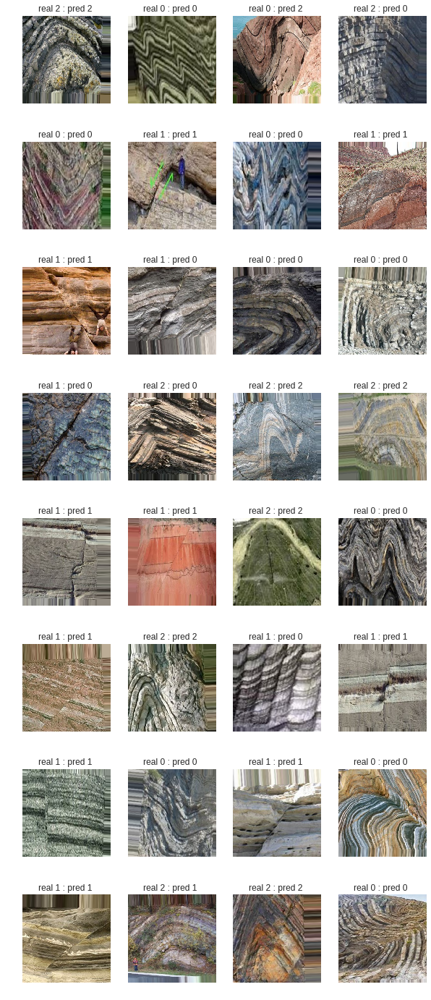

In [0]:
k=0
fig, m_axs = plt.subplots(8, 4, figsize = (10, 25))
for (c_x, c_y, c_ax) in zip(test_X, test_Y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,:]/255,  vmin = -120, vmax = 120)
    
    c_ax.set_title('real %s : pred %s ' % (y_test1[k],y_pred[k]))
    c_ax.axis('off')
    k=k+1

In [0]:
import time
import random
import requests



for i in range(0,100):
    r = requests.get('http://www.ursalary0.com/salaries/salary_view_tw/10207')
    ran=random.randint(0,100)
    time.sleep(ran)

KeyboardInterrupt: ignored

In [0]:
import cv2
#import matplotlib library
import matplotlib.pyplot as plt
#importing time library for speed comparisons of both classifiers
import time

In [0]:
from google.colab import files
uploaded=files.upload()

Saving an132.jpg to an132.jpg
Saving an132.xml.xml to an132.xml.xml


In [0]:
def convertToRGB(img): 
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [0]:
test1 = cv2.imread("an132.jpg")
#convert the test image to gray image as opencv face detector expects gray images 
gray_img = cv2.cvtColor(test1, cv2.COLOR_BGR2GRAY)

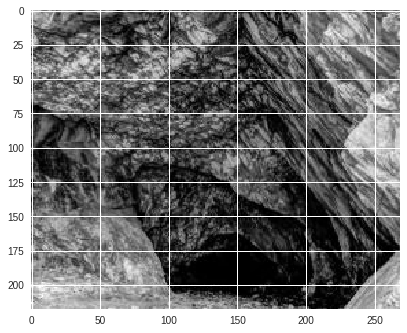

In [0]:
plt.imshow(gray_img, cmap='gray')  
haar_face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_alt.xml')

In [0]:

faces = haar_face_cascade.detectMultiScale(gray_img, scaleFactor=1.1, minNeighbors=5);  

#go over list of faces and draw them as rectangles on original colored 
for (x, y, w, h) in faces:     
         cv2.rectangle(test1, (x, y), (x+w, y+h), (0, 255, 0), 2)
        #let's detect multiscale (some images may be closer to camera than others) images 
#print the number of faces found 
print('Faces found: ', len(faces))

error: ignored

In [0]:
dir(haar_face_cascade)

['__class__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'convert',
 'detectMultiScale',
 'detectMultiScale2',
 'detectMultiScale3',
 'empty',
 'getFeatureType',
 'getOriginalWindowSize',
 'isOldFormatCascade',
 'load',
 'read']

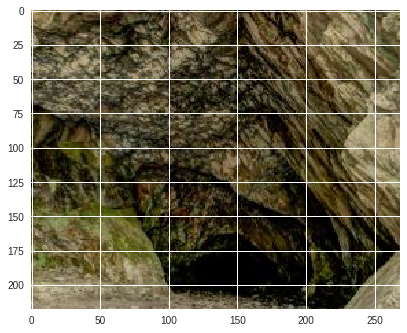

In [0]:
plt.imshow(convertToRGB(test1))

In [0]:
def detect_faces(f_cascade, colored_img, scaleFactor = 1.1):
  img_copy = colored_img.copy()  
  gray = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
  faces = f_cascade.detectMultiScale(gray, scaleFactor=scaleFactor, minNeighbors=5);          
  for (x, y, w, h) in faces:
    cv2.rectangle(img_copy, (x, y), (x+w, y+h), (0, 255, 0), 2)              
  return img_copy  
    
 #just making a copy of image passed, so that passed image is not changed 
    
  
 
 #convert the test image to gray image as opencv face detector expects gray images
         
 
 #let's detect multiscale (some images may be closer to camera than others) images
 
 
 #go over list of faces and draw them as rectangles on original colored img
 
      
 
 

In [0]:
test2 = cv2.imread('test3.jpg')  
 
#call our function to detect faces 
faces_detected_img = detect_faces(haar_face_cascade, test2)  
 
#convert image to RGB and show image 
plt.imshow(convertToRGB(faces_detected_img))